In [ ]:
# Les lib utilsés
# !pip install networkx
# !pip install matplotlib
# !pip install numpy
# !pip install timeit

# Implémentation de l'algorithme

In [2]:
import timeit
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

cmap = plt.get_cmap('tab20')

In [3]:
class Leiden:
    

    def __init__(self, G):
        self.init_G= G
        self.init_label= {node:i for i,node in enumerate(self.init_G.nodes())}
        self.dict_init={i:i for i in self.init_G.nodes()}
        self.G = G
        self.labels = {node:i for i,node in enumerate(self.G.nodes())}
        self.old_label = {}
        self.label_num = len(self.G.nodes())
        self.max_iter = 100
        self.iter = 0
        self.pile = [node for node in self.G.nodes()]

    def get_label_num(self):
        return np.unique(list(self.labels.values())).shape[0]

    def delta_modularity(self,node,community):

        mod=self.get_G_modularity()
       
        old_com=self.labels[node]
        self.labels[node] = community
        new_mod=self.get_G_modularity()
        self.labels[node]= old_com
    
        return new_mod-mod
            
    def draw_graph(self,label=False,init=False):
      
        if init:
            G=self.init_G
            labels=self.init_label
        else :
            G=self.G
            labels=self.labels

        map= [v for _,v in labels.items()]
        u=np.unique(map)
        fixed_map=[np.where(u==i)[0][0] for i in map]
        node_cmap = [cmap(v) for v in fixed_map]
        
        pos = nx.spring_layout(G,seed=40)
        if label:
            labels = {node:node for node in G.nodes()}
            nx.draw_networkx_labels(G, pos, labels, font_size=10)
            
        nx.draw(G, pos, node_size = 75, alpha = 0.8, node_color=node_cmap)
        plt.show()

    
    
    def refine(self):
        communities = self.get_communities()
        for C in communities.values():
            self.merge_nodes_subset(C)


    def merge_nodes_subset(self,S,gamma=1.,theta=1.):
        communities=self.get_communities()
        base={node:i for i,node in enumerate(self.G.nodes())}
        nS = S.copy()
        R = {v for v in S if self.G.degree(v, nS.remove(v)) >= gamma * (len(S) - 1)}
        for v in R:
            if self.labels[v] == base[v]:
                probs = {}
                for c in S:
                    delta_HP = self.delta_modularity(v, c)
                    if delta_HP >= 0:
                        probs[c] = np.exp(delta_HP / theta)
                    else:
                        probs[c] = 0
                if probs:
                    new_C = max(probs, key=probs.get)
                    self.labels[v] = new_C

    def move_node_fast(self,draw=False):
        self.old_label = self.labels.copy()
        if draw:
            self.draw_graph()
        while len(self.pile) > 0:
            node = self.pile.pop(0)
            best_community = self.labels[node]
            best_delta_mod = 0
            neighbors = self.G.neighbors(node)
            for neighbor in neighbors:
                community = self.labels[neighbor]
                delta_mod = self.delta_modularity(node,community)
                if delta_mod > best_delta_mod:
                    best_community = community
                    best_delta_mod = delta_mod
            if best_community != self.labels[node]:
                self.labels[node] = best_community
                for neighbor in neighbors:
                    if neighbor not in self.pile and self.labels[neighbor] != best_community:
                        self.pile.append(neighbor)
        if draw:
            self.draw_graph()
    
        self.init_label={node:self.labels[self.dict_init[node]] for node in self.init_G.nodes()}

    
    def aggregation(self):
        communities = self.get_communities()
        agg_G = nx.Graph()
        for C in communities:
            agg_G.add_node(C)
        for u, v in self.G.edges():
            for C in communities:
                if u in communities.get(C):
                    for D in communities:
                        if v in communities.get(D):
                            agg_G.add_edge(C, D)
                            break
                    break
        
        dict_init={node:self.labels[self.dict_init[node]] for node in self.init_G.nodes()}
        self.dict_init=dict_init
        self.G = agg_G
        self.labels = {node:i for i,node in enumerate(self.G.nodes())}
        self.label_num = len(self.G.nodes())
        self.pile = [node for node in self.G.nodes()]

    def run(self,draw=False):
        while self.iter < self.max_iter:
            self.move_node_fast(draw)
            if self.labels == self.old_label:
                break
            #self.refine()
            self.aggregation()
            self.iter += 1
        self.draw_graph(init=True)

    def get_communities(self):
        comm_dict = {}
        for node,comm in self.labels.items():
            if comm in comm_dict:
                comm_dict[comm].add(node)
            else:
                comm_dict[comm] = {node}
        return comm_dict

    def get_init_communities(self):
        comm_dict = {}
        for node,comm in self.init_label.items():
            if comm in comm_dict:
                comm_dict[comm].add(node)
            else:
                comm_dict[comm] = {node}
        return comm_dict

    def get_G_modularity(self):
        return nx.algorithms.community.modularity(self.G, self.get_communities().values())

    def get_init_G_modularity(self):
        comm_dict = {}
        for node,comm in self.init_label.items():
            if comm in comm_dict:
                comm_dict[comm].add(node)
            else:
                comm_dict[comm] = {node}
        return nx.algorithms.community.modularity(self.init_G, comm_dict.values())

# À vos marques, prêts... au tests!!!

## Dataset dolphins

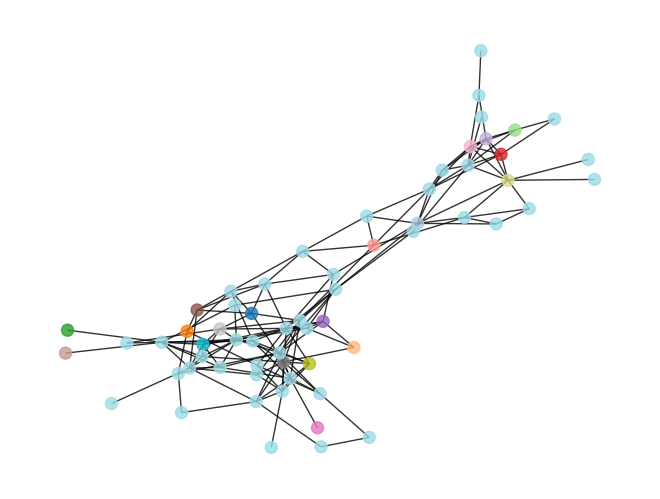

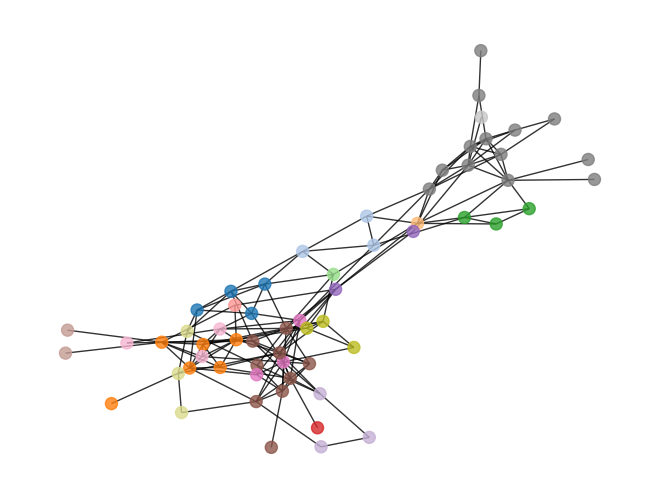

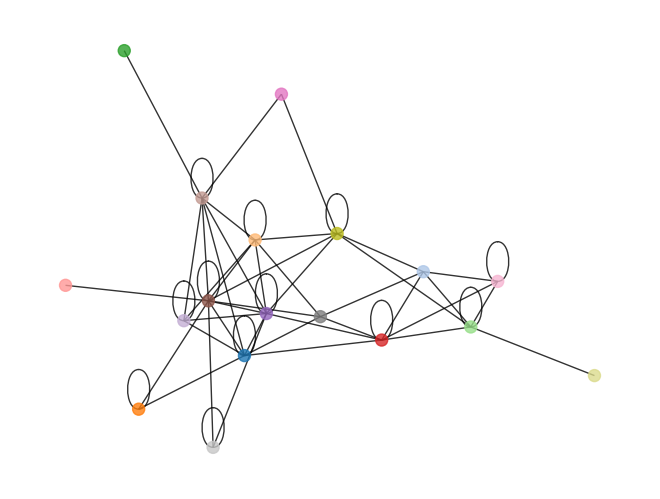

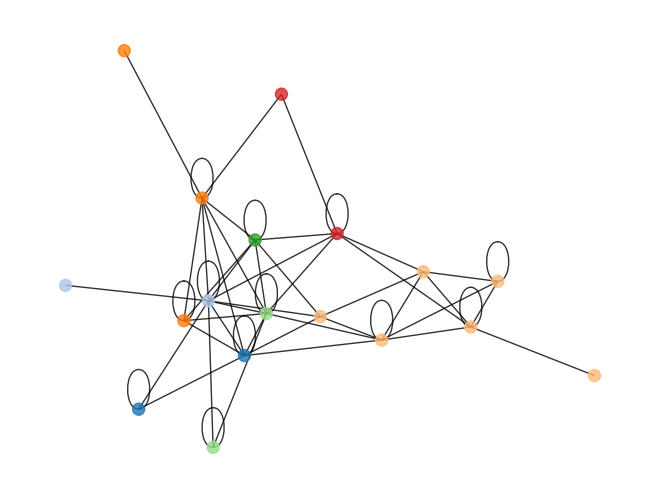

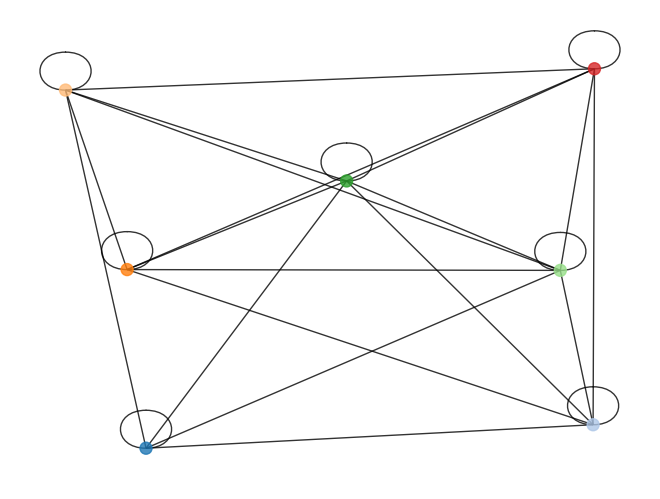

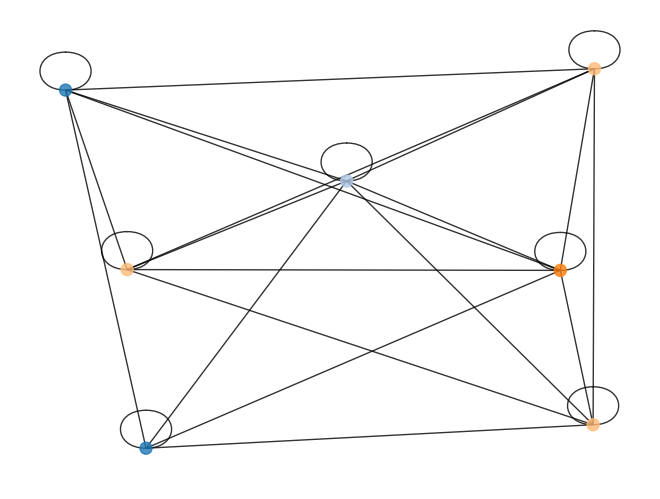

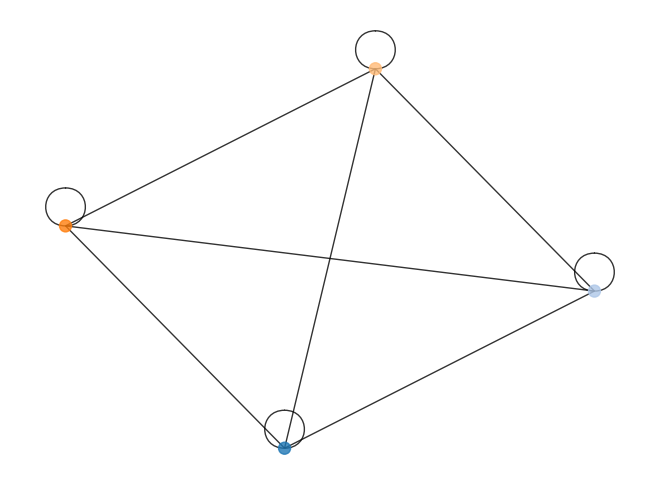

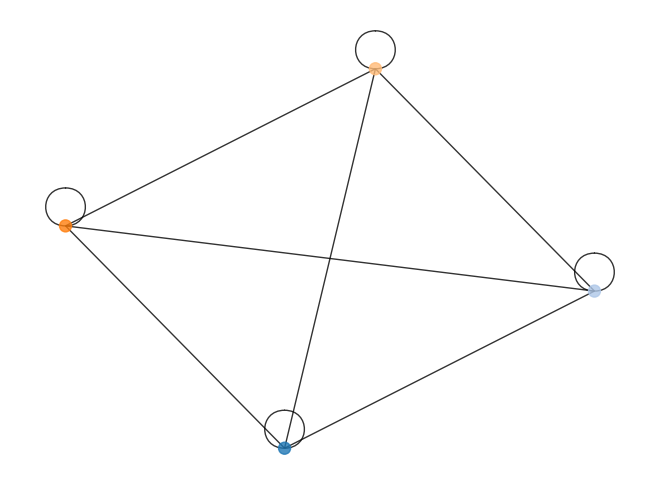

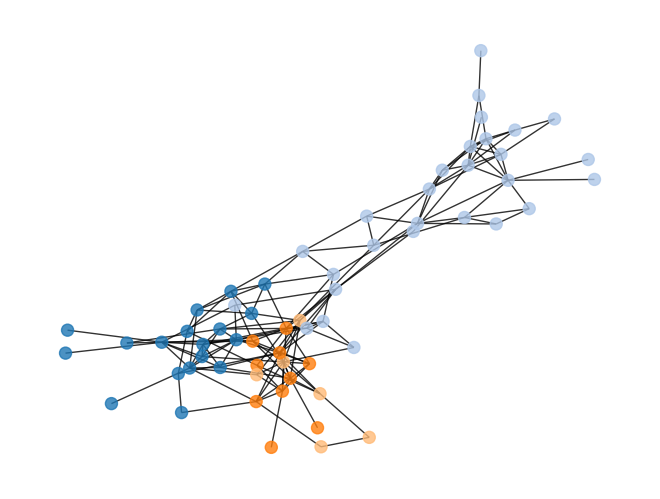

Nombre de communautés: 4
Temmps: 1.0148876999737695
modularité: 0.4118705747399232


In [4]:
G=nx.read_gml("DataSets/réels/dolphins/dolphins.gml")
algorithm = Leiden(G)

start = timeit.default_timer()
algorithm.run(draw=True)
end = timeit.default_timer()
print("Nombre de communautés:",algorithm.get_label_num())
print("Temmps:",end - start)
print("modularité:",algorithm.get_init_G_modularity())

## Dataset football

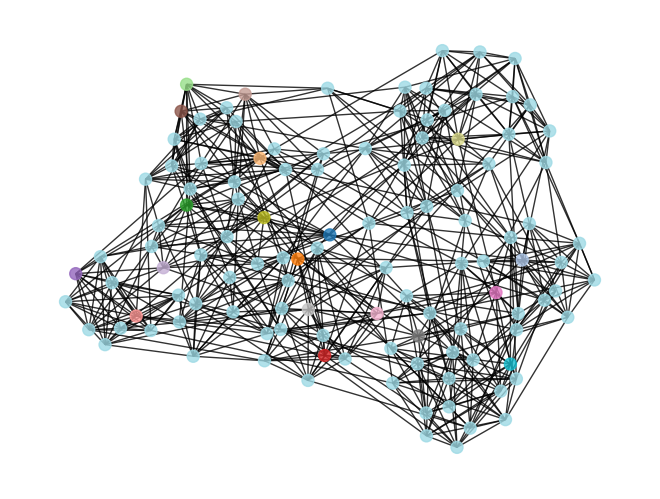

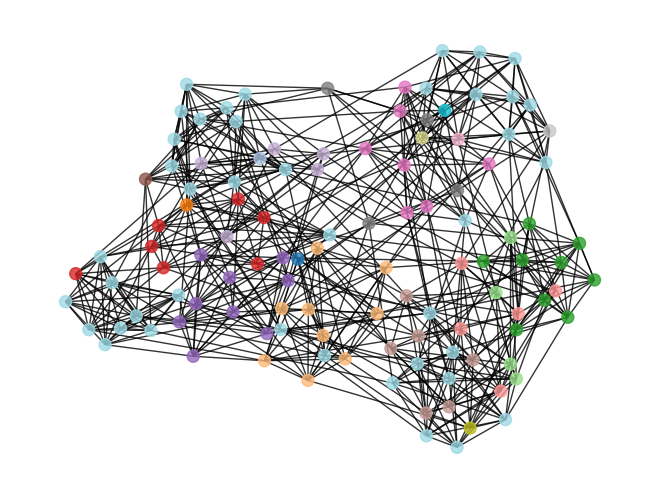

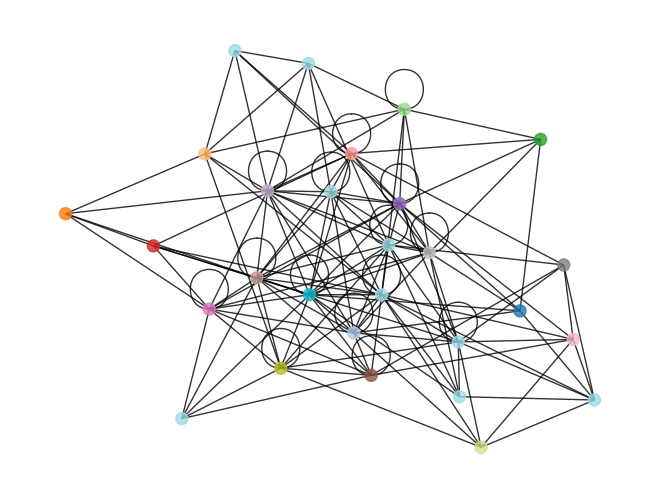

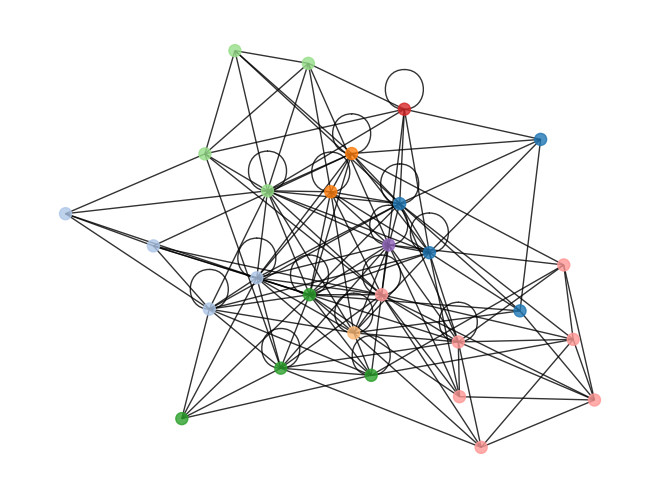

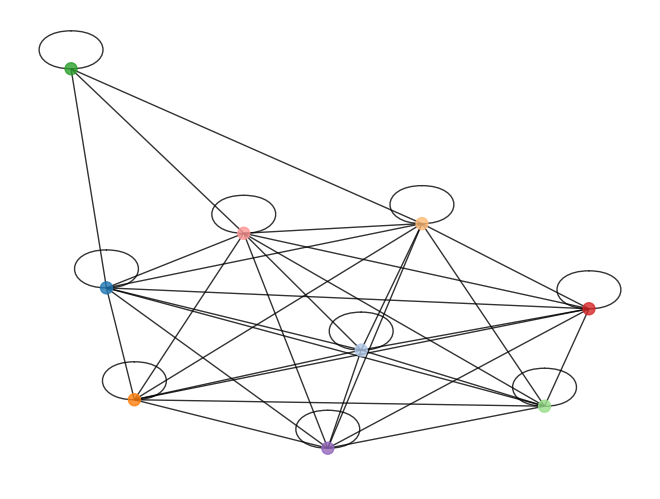

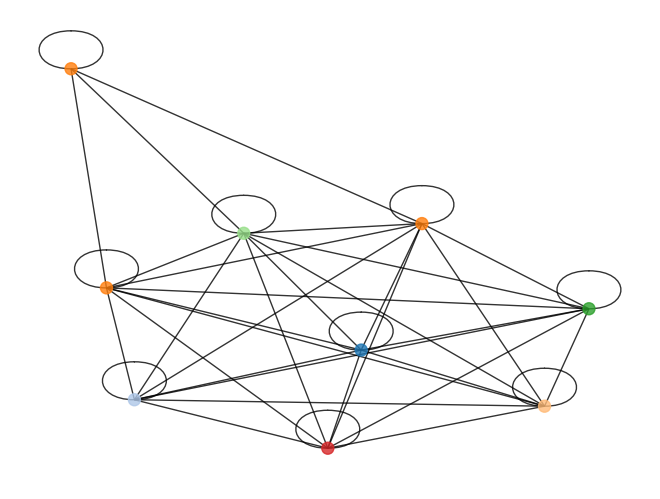

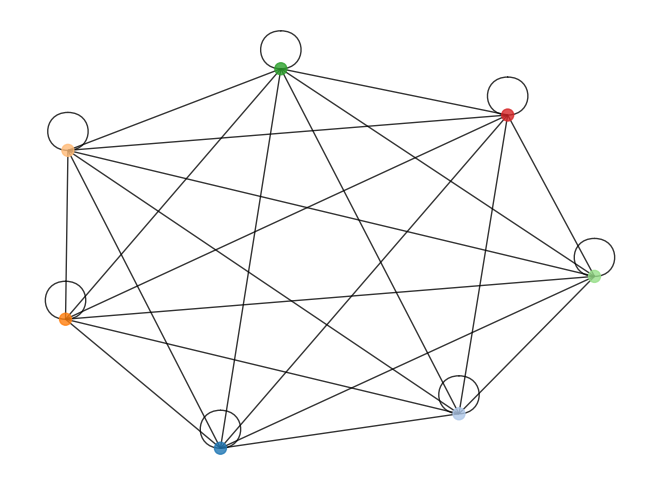

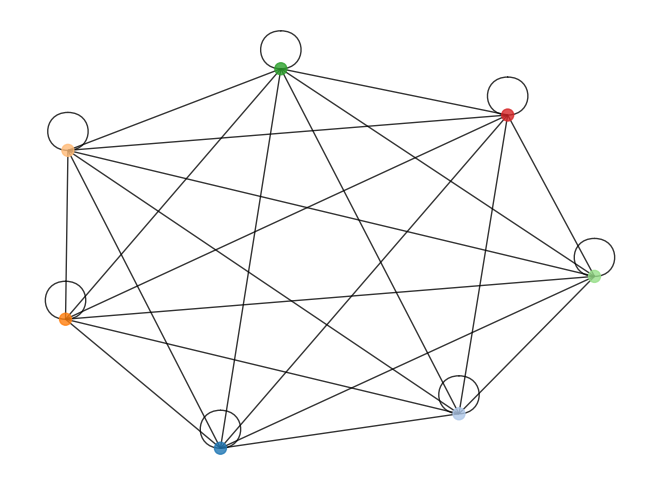

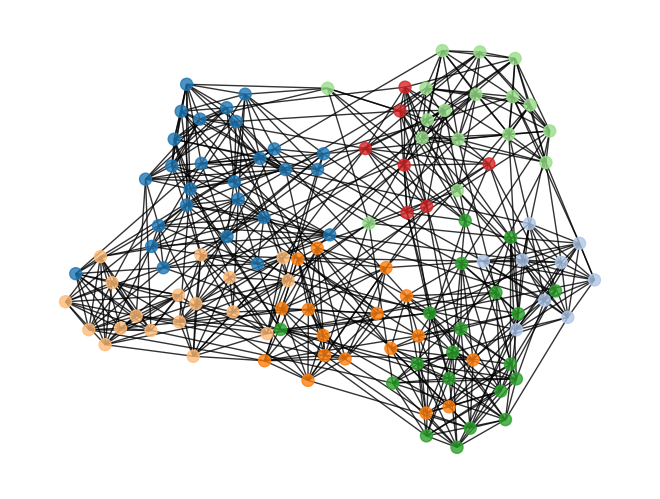

Nombre de communautés: 7
Temmps: 2.9276937000104226
modularité: 0.5348951084309775


In [5]:
G=nx.read_gml("DataSets/réels/football/football.gml")
algorithm = Leiden(G)

start = timeit.default_timer()
algorithm.run(draw=True)
end = timeit.default_timer()
print("Nombre de communautés:",algorithm.get_label_num())
print("Temmps:",end - start)
print("modularité:",algorithm.get_init_G_modularity())

## Dataset karate

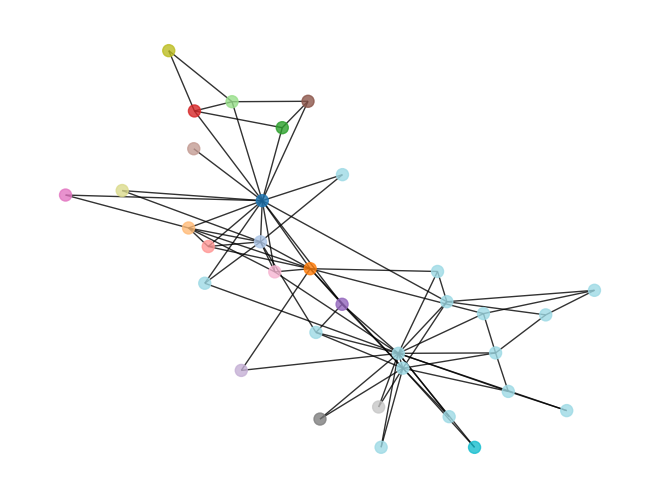

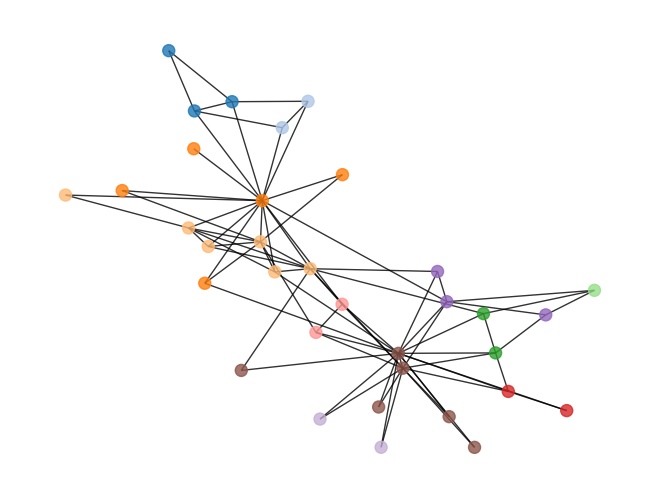

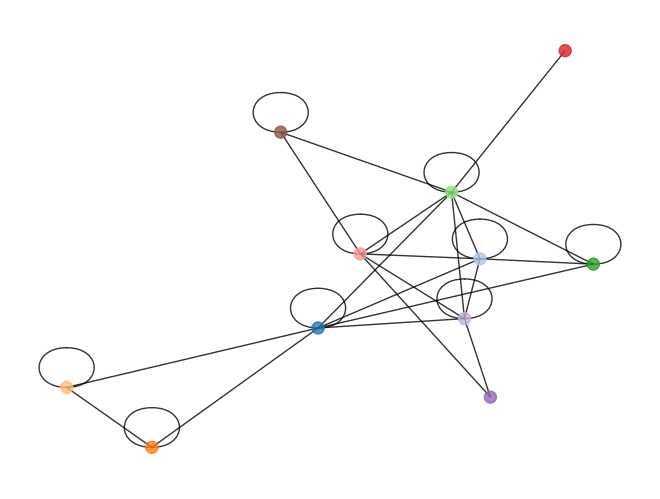

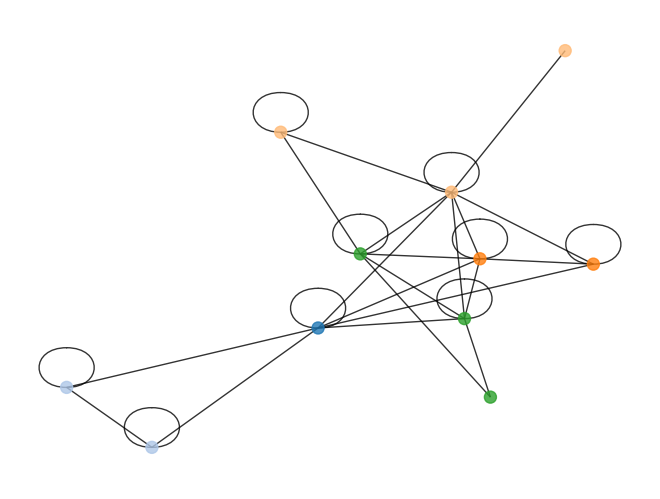

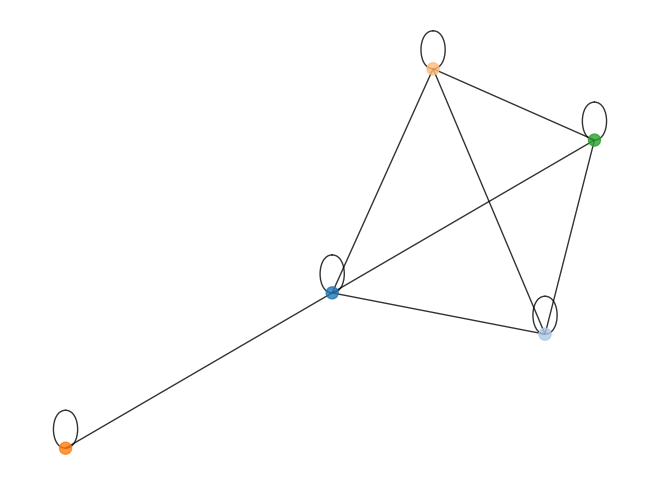

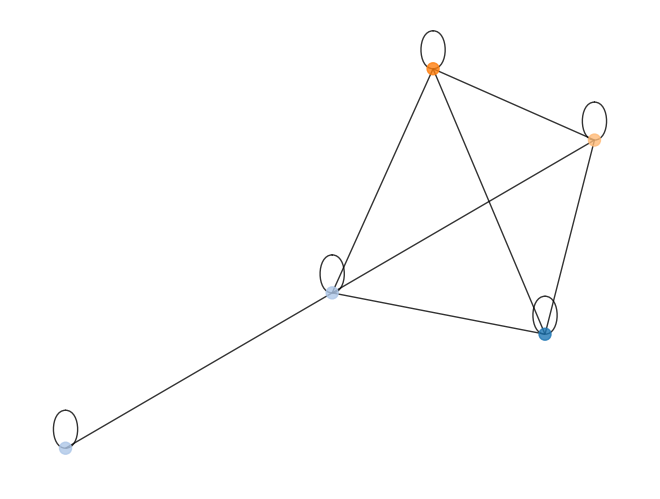

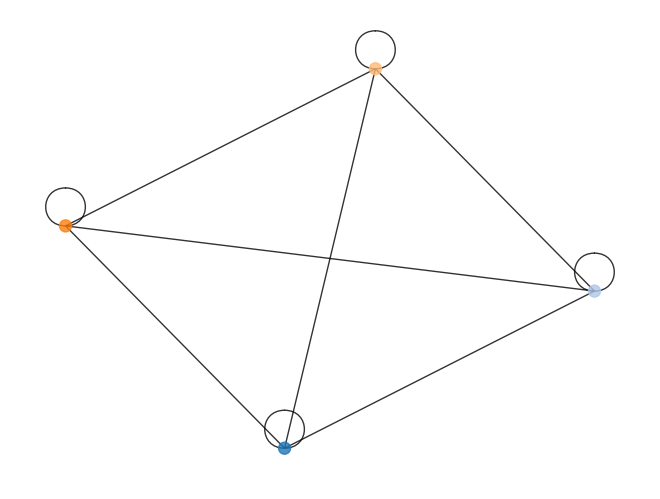

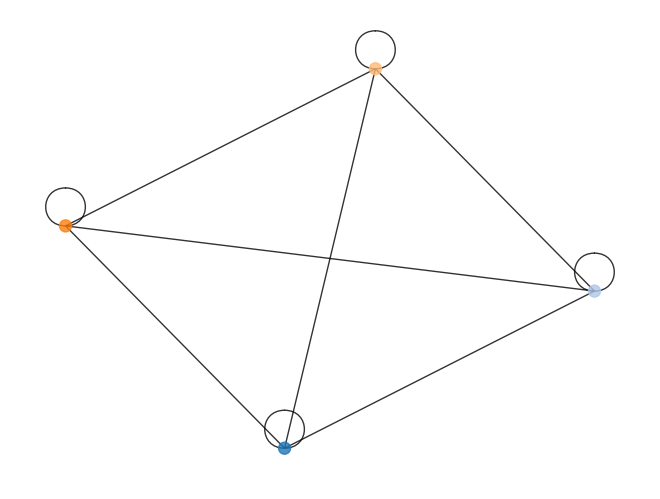

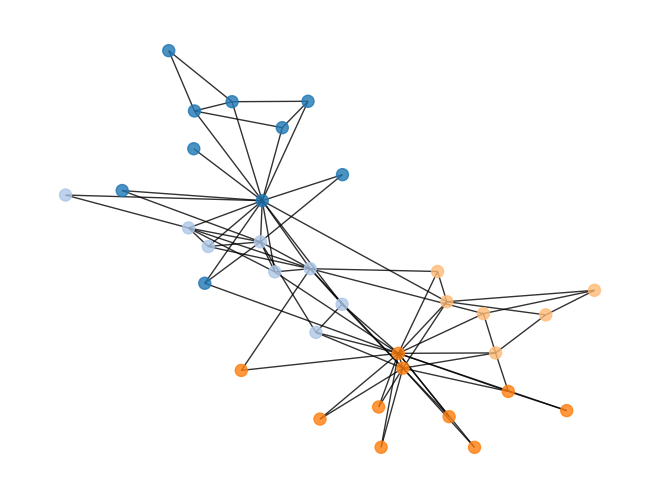

Nombre de communautés: 4
Temmps: 0.7619872000068426
modularité: 0.4064204194074324


In [6]:
G=nx.karate_club_graph()
algorithm = Leiden(G)

start = timeit.default_timer()
algorithm.run(draw=True)
end = timeit.default_timer()
print("Nombre de communautés:",algorithm.get_label_num())
print("Temmps:",end - start)
print("modularité:",algorithm.get_init_G_modularity())

## Dataset polbooks

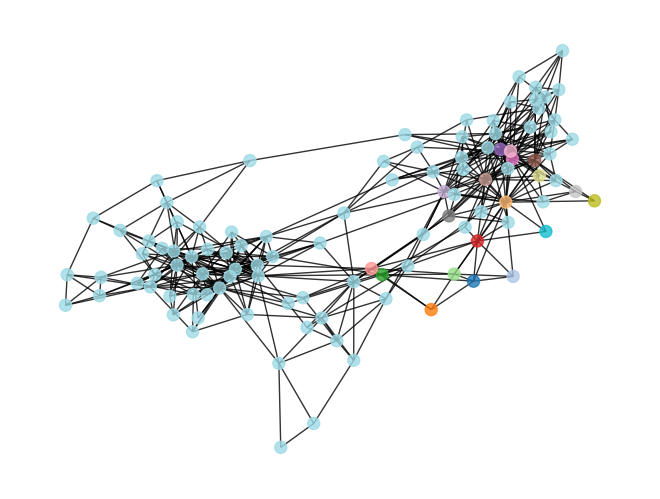

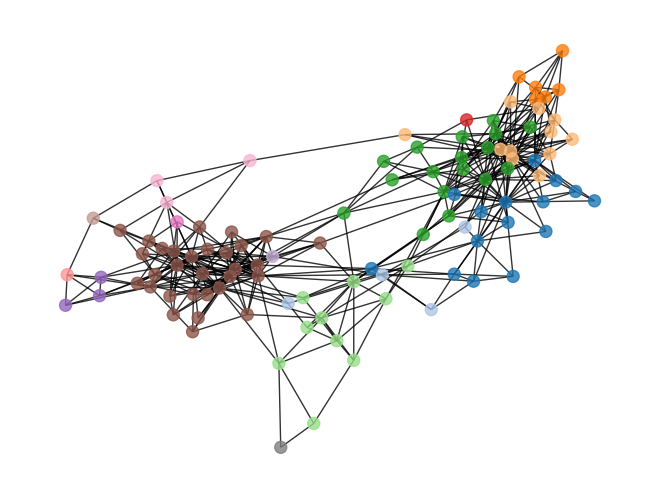

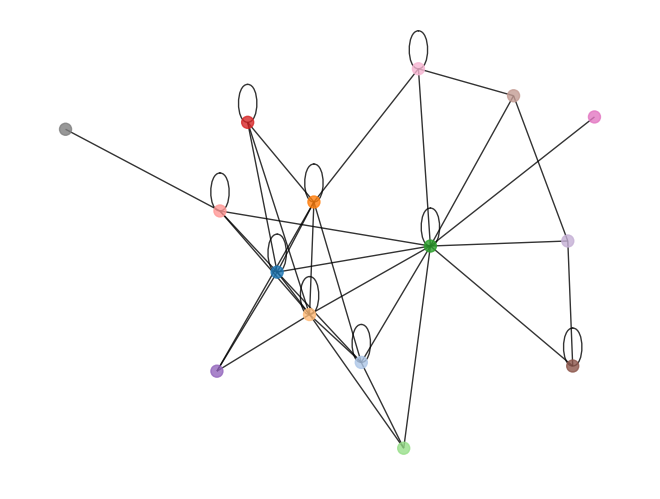

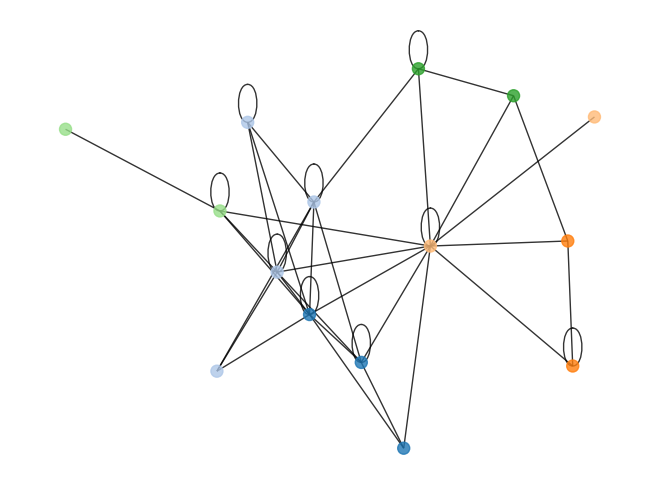

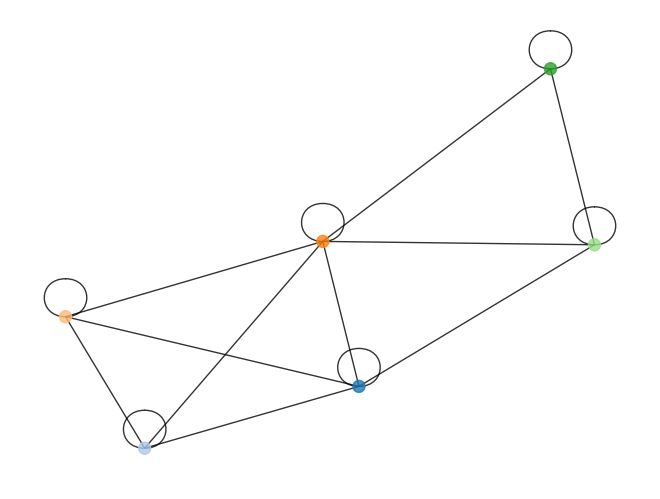

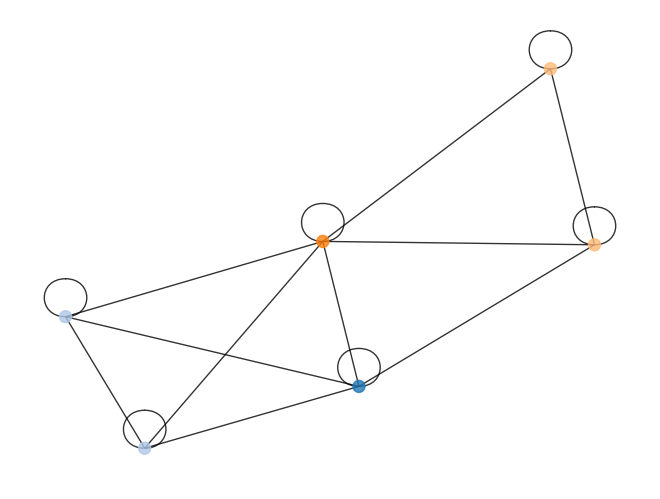

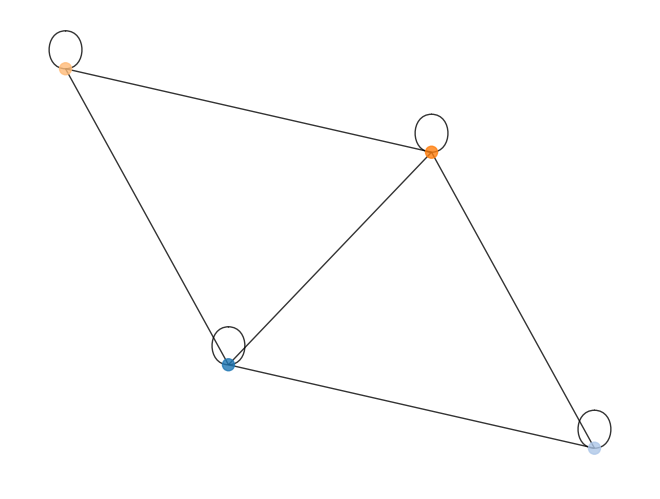

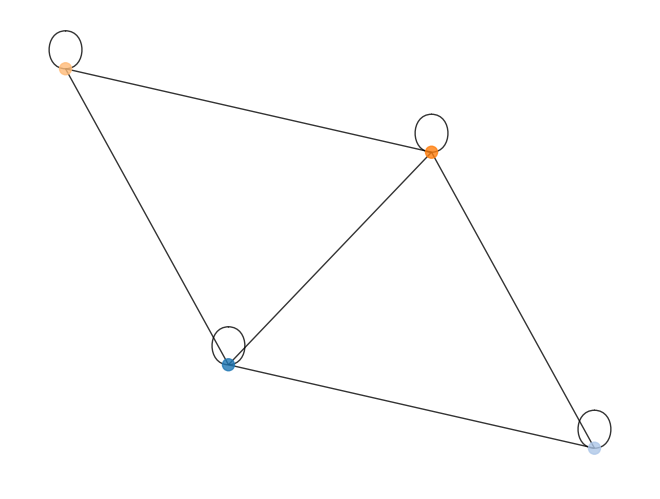

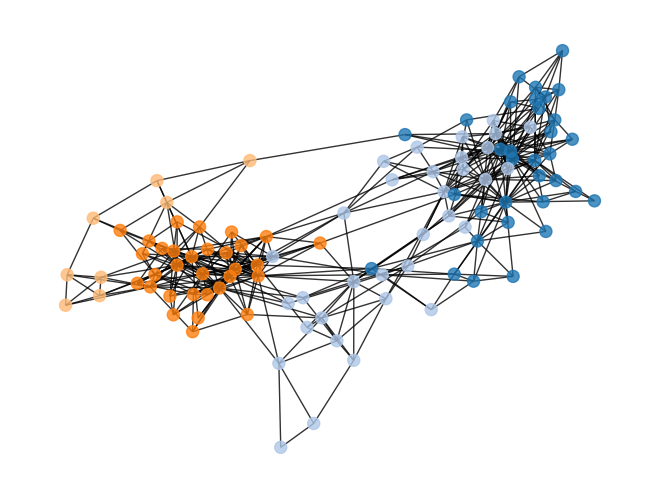

Nombre de communautés: 4
Temmps: 1.9222674000193365
modularité: 0.4442130593734092


In [7]:
G=nx.read_gml("DataSets/réels/polbooks/polbooks.gml")
algorithm = Leiden(G)

start = timeit.default_timer()
algorithm.run(draw=True)
end = timeit.default_timer()
print("Nombre de communautés:",algorithm.get_label_num())
print("Temmps:",end - start)
print("modularité:",algorithm.get_init_G_modularity())

## Dataset synthétiques μ=0.1

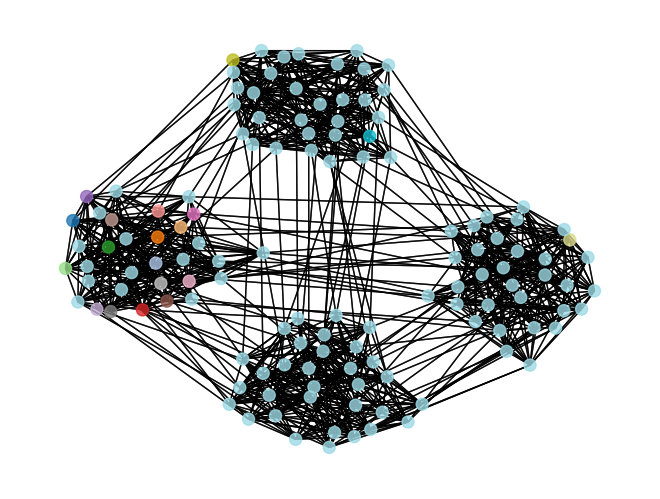

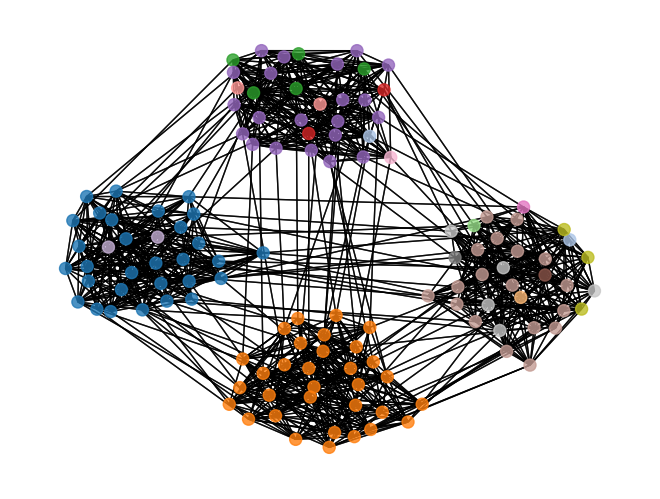

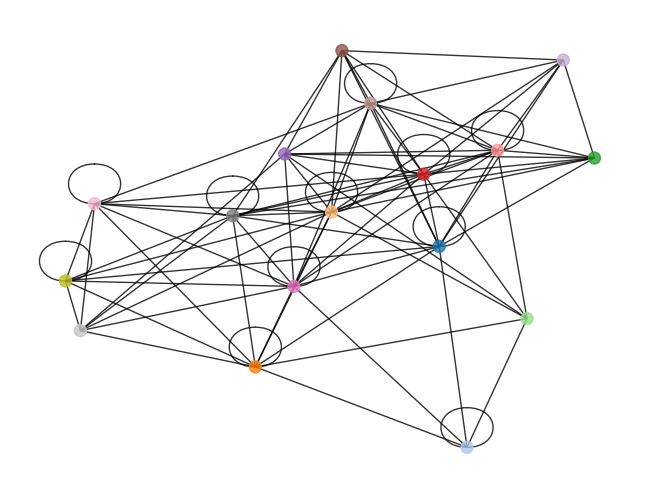

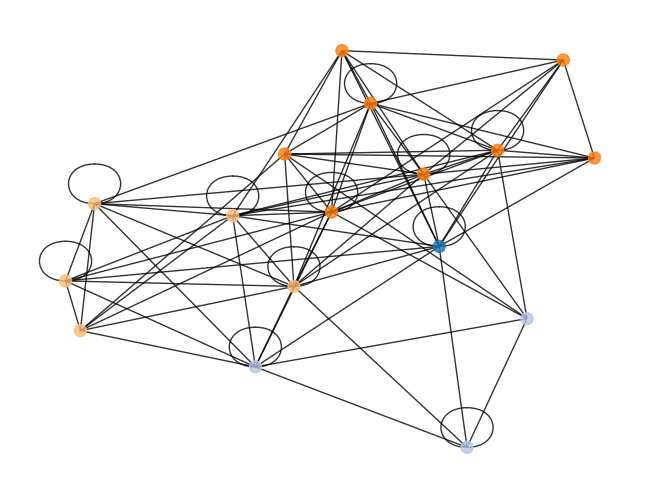

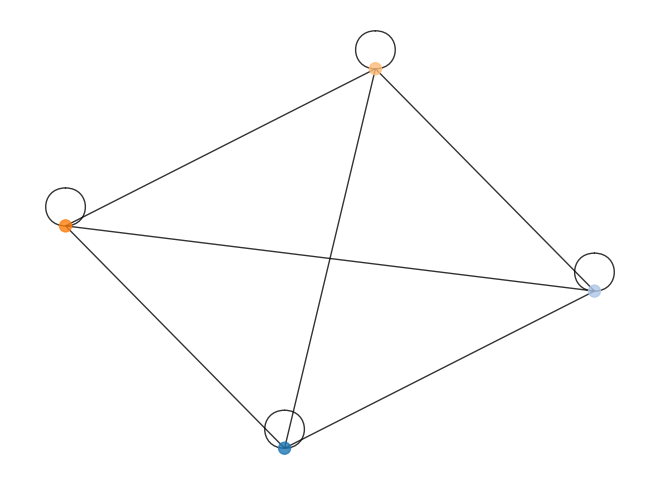

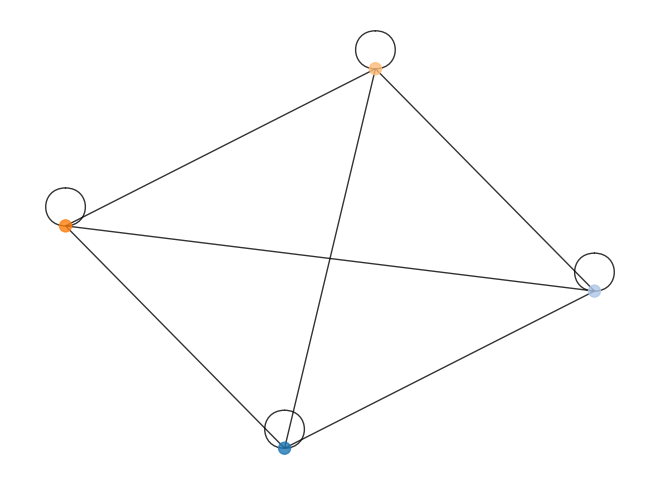

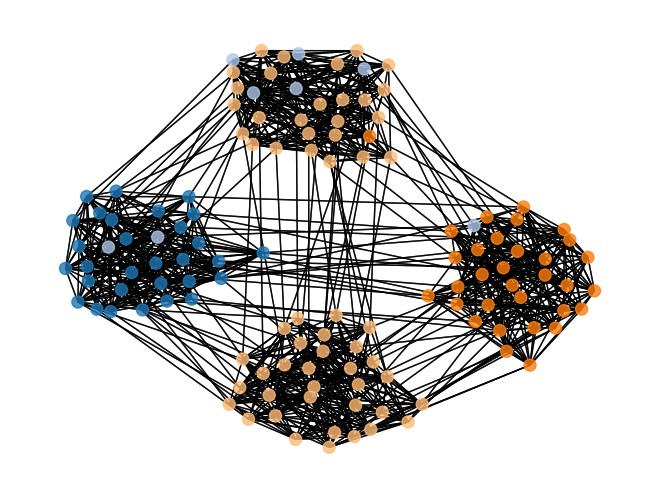

Nombre de communautés: 4
Temmps: 9.404566899989732
modularité: 0.49169921875


In [8]:
G = nx.MultiGraph()
nx.read_edgelist('./DataSets/synthétiques/network_mu_01.dat', create_using=G, nodetype=int)
algorithm = Leiden(G)

start = timeit.default_timer()
algorithm.run(draw=True)
end = timeit.default_timer()
print("Nombre de communautés:",algorithm.get_label_num())
print("Temmps:",end - start)
print("modularité:",algorithm.get_init_G_modularity())

## Dataset synthétiques μ=0.3

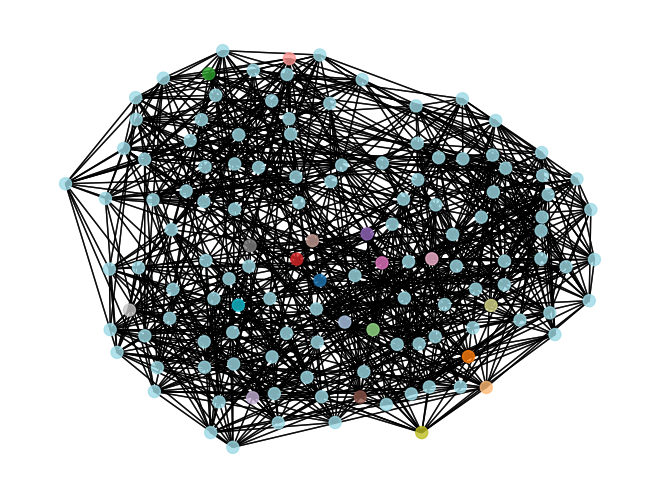

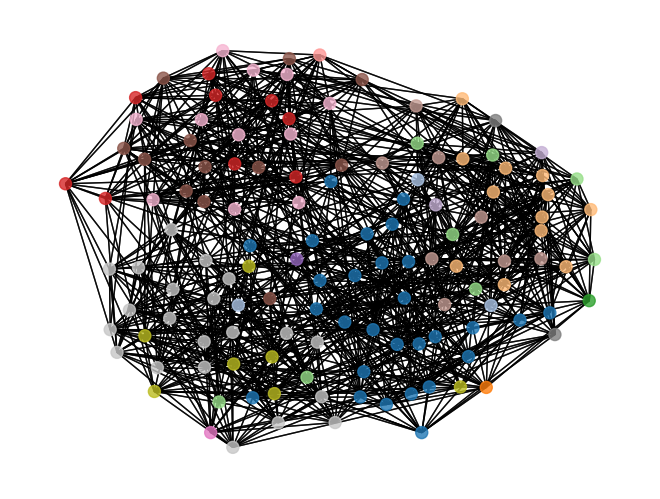

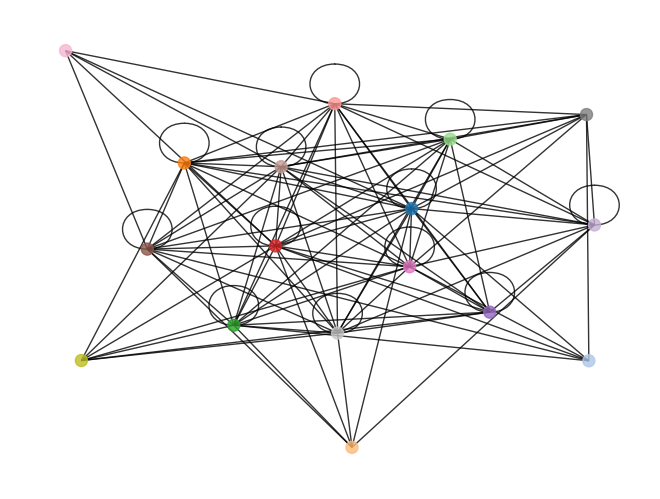

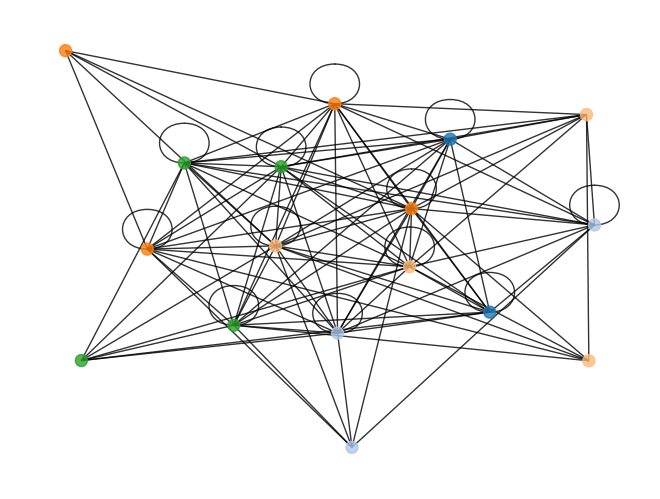

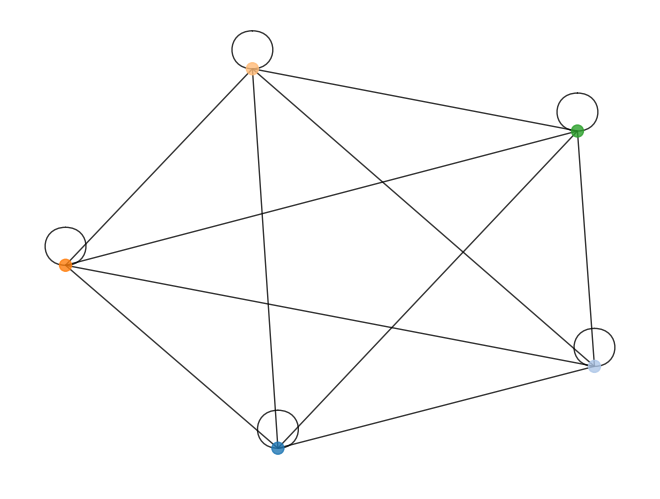

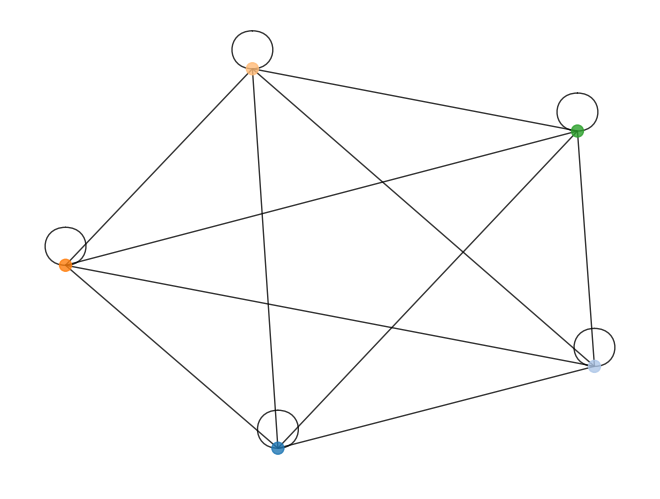

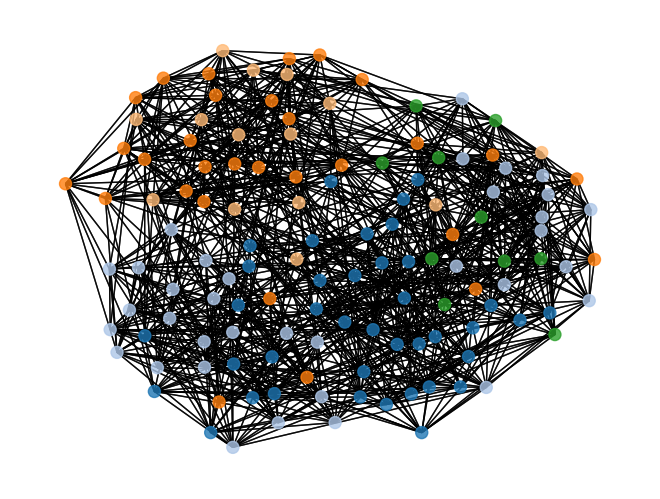

Nombre de communautés: 5
Temmps: 9.7665796999936
modularité: 0.2398681640625


In [9]:
G = nx.MultiGraph()
nx.read_edgelist('./DataSets/synthétiques/network_mu_03.dat', create_using=G, nodetype=int)
algorithm = Leiden(G)

start = timeit.default_timer()
algorithm.run(draw=True)
end = timeit.default_timer()
print("Nombre de communautés:",algorithm.get_label_num())
print("Temmps:",end - start)
print("modularité:",algorithm.get_init_G_modularity())

## Dataset synthétiques μ=0.5

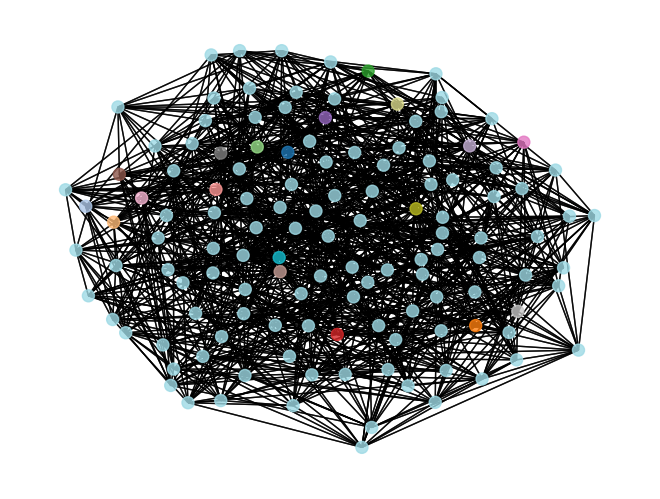

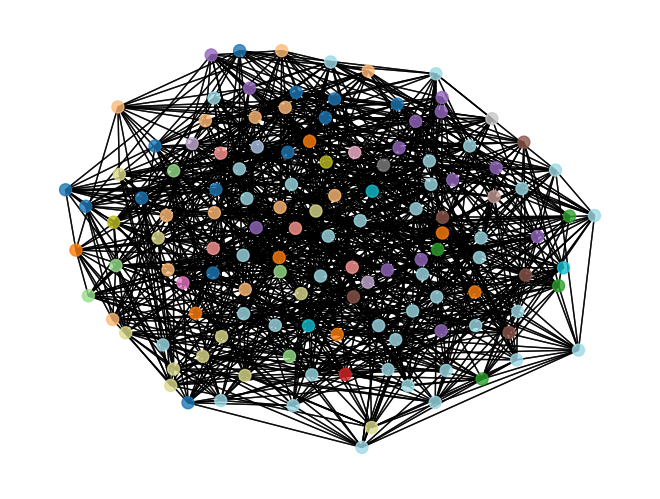

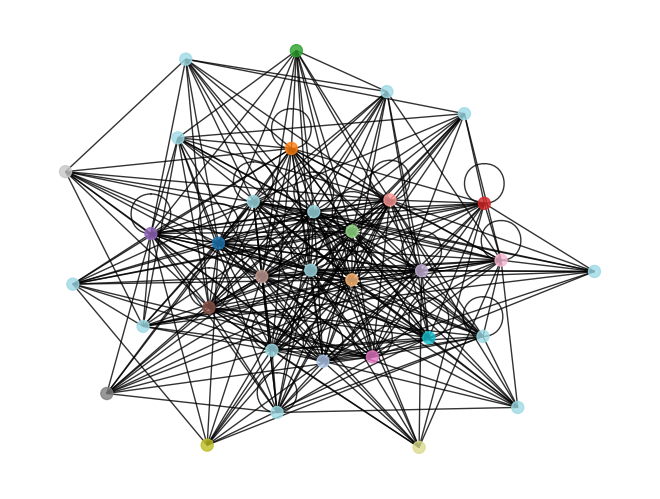

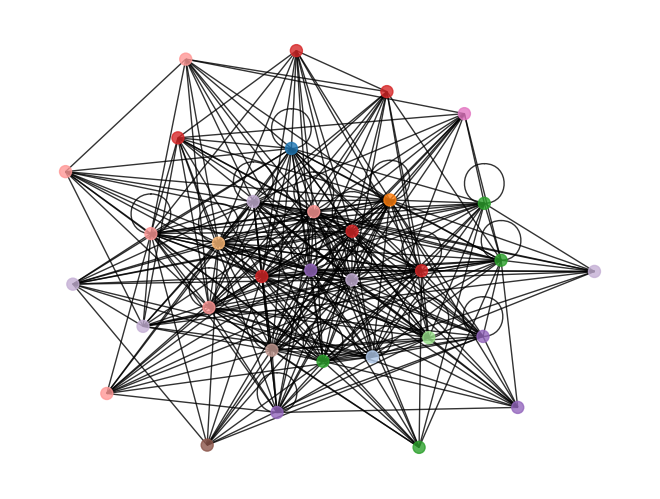

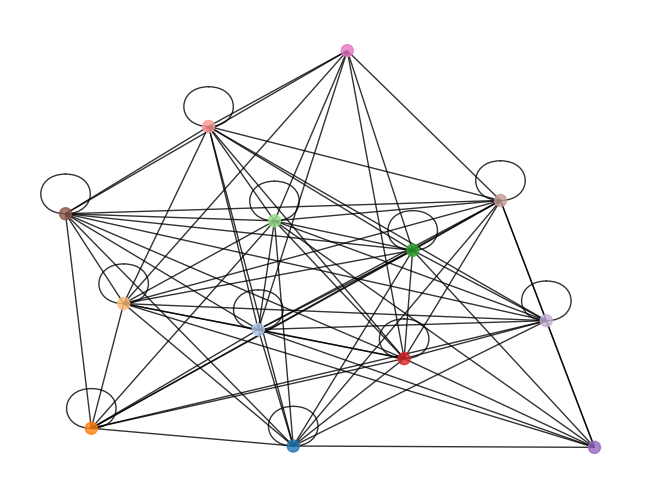

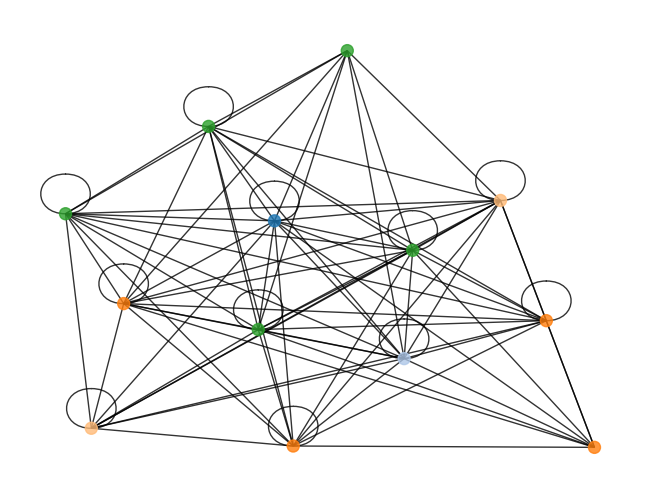

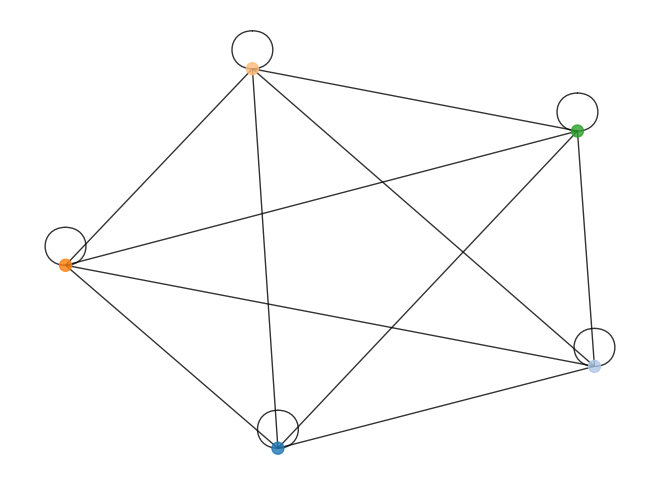

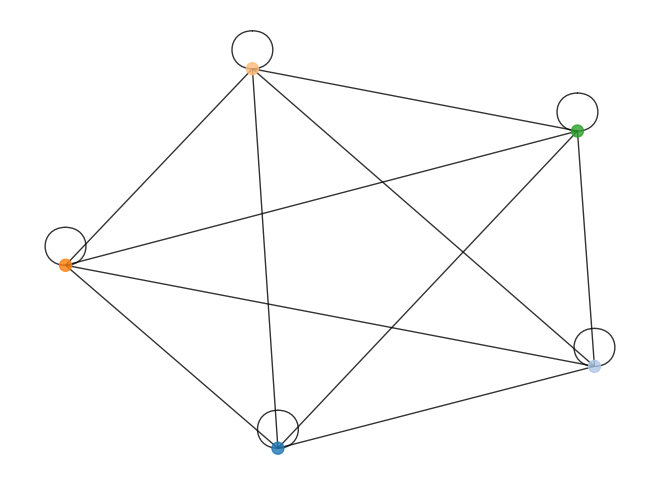

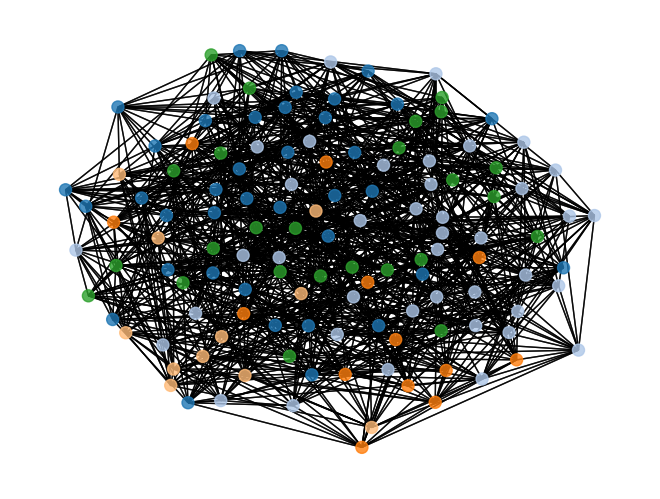

Nombre de communautés: 5
Temmps: 10.918363800010411
modularité: 0.14599609375


In [10]:
G = nx.MultiGraph()
nx.read_edgelist('./DataSets/synthétiques/network_mu_05.dat', create_using=G, nodetype=int)
algorithm = Leiden(G)

start = timeit.default_timer()
algorithm.run(draw=True)
end = timeit.default_timer()
print("Nombre de communautés:",algorithm.get_label_num())
print("Temmps:",end - start)
print("modularité:",algorithm.get_init_G_modularity())